Import Libraries

https://jovian.ai/bnuratum/applying-cnn-on-chest-xray-images#C32

In [1]:
import os, sys, time, copy, glob, random
from tqdm.notebook import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from torchvision import transforms, datasets, models
import torch, torchvision
from torch import optim, cuda
from torch.utils.data import Dataset, DataLoader, sampler
import torch.nn as nn
from torchsummary import summary

import cv2

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [4]:
parent_path = '/home/sysadm/Desktop/3ml/ZhangLabData/CellData/chest_xray'
train_dir = os.path.join(parent_path, 'train/')
valid_dir = os.path.join(parent_path, 'val/')
test_dir = os.path.join(parent_path, 'test/')

In [5]:
save_file_name = "vgg16-chest-4.pt"
checkpoint_path = "vgg16-chest-4.pth"

In [6]:
#Change to fit hardware
batch_size = 128

# Whether to train on a gpu
train_on_gpu = cuda.is_available()
print(f'Train on gpu: {train_on_gpu}')

# Number of gpus
if train_on_gpu:
    gpu_count = cuda.device_count()
    print(f'{gpu_count} gpus detected.')
    if gpu_count > 1:
        multi_gpu = True
    else:
        multi_gpu = False

Train on gpu: True
1 gpus detected.


In [7]:
# Empty lists
categories = []
img_categories= []
n_train = []
n_valid = []
n_test = []
heights = []
widths= []

# Iterate through each category
for d in os.listdir(train_dir):
    if not d.startswith('.'):
        categories.append(d)

        # Number of each image
        train_images = os.listdir(train_dir  +  d)
        valid_images = os.listdir(valid_dir + d)
        test_images = os.listdir(test_dir + d)
    
        # Number of datasets
        n_train.append(len(train_images))
        n_valid.append(len(valid_images))
        n_test.append(len(test_images))

        # Find stats for train images
        for i in train_images:
             if not i.startswith('.'):
                img_categories.append(d)
                img = cv2.imread(train_dir + d + '/' + i)
                img_array = np.array(img)
                  
                # Shape
                heights.append(img_array.shape[0])
                widths.append(img_array.shape[1])

In [8]:
categories_df = pd.DataFrame({
    "category": categories,
    "n_train": n_train,
    "n_valid": n_valid,
    "n_test": n_test
})
categories_df.sort_values("category")

,category,n_train,n_valid,n_test
1,NORMAL,1200,149,235
0,PNEUMONIA,3722,162,390


In [9]:
image_df = pd.DataFrame({
    "category": img_categories,
    "height": heights,
    "width": widths
})

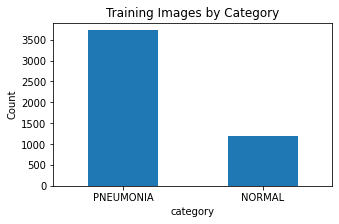

In [10]:
categories_df.set_index('category')['n_train'].plot.bar( figsize=(5, 3))
plt.xticks(rotation=0)
plt.ylabel('Count')
plt.title('Training Images by Category');

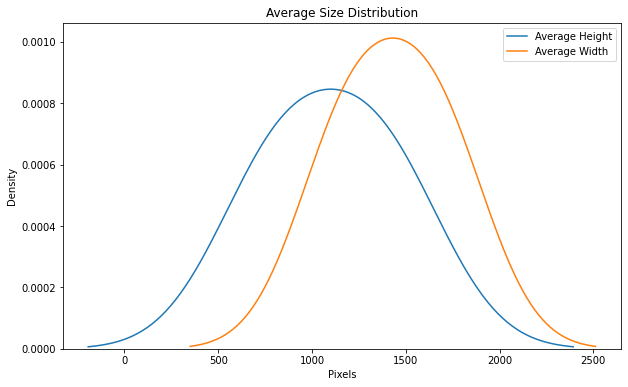

In [11]:
img_dsc = image_df.groupby("category").mean()
plt.figure(figsize=(10,6))
sns.kdeplot(img_dsc["height"],label="Average Height")
sns.kdeplot(img_dsc["width"],label="Average Width")
plt.xlabel("Pixels")
plt.ylabel("Density")
plt.title("Average Size Distribution")
plt.legend();

Define Transformation

In [12]:
# Here we use center crop size 224 and normalize mean vector [0.485, 0.456, 0.406],
# and standard deviation [0.229, 0.224, 0.225] for corresponding three channel (R,G,B)
# which are ImageNet standard augmentation technique parameter

transform_train = transforms.Compose([ 
    transforms.RandomResizedCrop(size =256, scale= (0.8, 1.0) ),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(),
    transforms.RandomHorizontalFlip(),
    transforms.CenterCrop(size =224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])
])

transform_valid = transforms.Compose([
    transforms.Resize(size=256),
    transforms.CenterCrop(size =224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize(size=256),
    transforms.CenterCrop(size =224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225]) 
])


Read the image path and class

In [13]:
train_set = datasets.ImageFolder(train_dir, transform = transform_train)
val_set = datasets.ImageFolder(valid_dir, transform = transform_valid)
test_set= datasets.ImageFolder(test_dir,transform=transform_test)

In [14]:
# Dataloader iterators
train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_set,batch_size=batch_size,shuffle=True)
test_loader = torch.utils.data.DataLoader(test_set,batch_size=batch_size,shuffle=True)

In [15]:
train_iter = iter(train_loader)
images, labels = next(train_iter)

print(images.shape)
print(labels.shape)

torch.Size([128, 3, 224, 224])
torch.Size([128])


In [16]:
def imshow(img, title):
    npimg = img.numpy()
    plt.figure(figsize=(432,288))
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.show()

def show_batch_images(data_loader):
    images, labels = next(iter(data_loader))
    img = torchvision.utils.make_grid(images,padding=25)
    imshow(img, title=["NORMAL" if x==0  else "PNEUMONIA" for x in labels])

show_batch_images(train_loader)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [17]:
model = models.vgg16(pretrained=True)

In [18]:
for param in model.parameters():
    param.requires_grad = False

In [19]:
n_inputs = model.classifier[6].in_features

# Add on classifier
model.classifier[6] = nn.Sequential(
    nn.Linear(n_inputs, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 2),
    nn.LogSoftmax(dim=1)
)

model.classifier

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Sequential(
    (0): Linear(in_features=4096, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.4, inplace=False)
    (3): Linear(in_features=256, out_features=2, bias=True)
    (4): LogSoftmax(dim=1)
  )
)

In [20]:
total_params = sum(p.numel() for p in model.parameters())
print(f'{total_params:,} total parameters.')
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f'{total_trainable_params:,} training parameters.')

135,309,890 total parameters.
1,049,346 training parameters.


In [21]:
# Moving to GPU
if train_on_gpu:
    model = model.to('cuda')

if multi_gpu:
    model = nn.DataParallel(model)

/home/sysadm/anaconda3/lib/python3.7/site-packages/torch/cuda/__init__.py:83: UserWarning: 
    Found GPU%d %s which is of cuda capability %d.%d.
    PyTorch no longer supports this GPU because it is too old.
    The minimum cuda capability supported by this library is %d.%d.
    
  warnings.warn(old_gpu_warn.format(d, name, major, minor, min_arch // 10, min_arch % 10))


In [22]:
#Load the pre-trained model

def get_pretrained_model(model_name):
    if model_name == 'vgg16':
        model = models.vgg16(pretrained=True)

        # Freeze early layers
        for param in model.parameters():
            param.requires_grad = False
        n_inputs = model.classifier[6].in_features

        # Add on classifier
        model.classifier[6] = nn.Sequential(
            nn.Linear(n_inputs, 256), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(256, 2), nn.LogSoftmax(dim=1))

    elif model_name == 'resnet50':
        model = models.resnet50(pretrained=True)

        for param in model.parameters():
            param.requires_grad = False

        n_inputs = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Linear(n_inputs, 256), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(256, 2), nn.LogSoftmax(dim=1))

    # Move to gpu and parallelize
    if train_on_gpu:
        model = model.to('cuda')

    if multi_gpu:
        model = nn.DataParallel(model)

    return model

In [23]:
model = get_pretrained_model('vgg16')
if multi_gpu:
    summary(
        model.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device='cuda')
else:
    summary(model, input_size=(3, 224, 224), batch_size=batch_size, device='cuda')

RuntimeError: CUDA error: no kernel image is available for execution on the device
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.

In [ ]:
#Mapping of Classes to Indexes
model.class_to_idx = train_set.class_to_idx
model.idx_to_class = {
    idx: class_
    for class_, idx in model.class_to_idx.items()
}

list(model.idx_to_class.items())

In [ ]:
#Training Loss and Optimizer
criterion = nn.NLLLoss()
optimizer = optim.Adam(model.parameters())

for p in optimizer.param_groups[0]['params']:
    if p.requires_grad:
        print(p.shape)

In [ ]:
def train(model,
          criterion,
          optimizer,
          train_loader,
          valid_loader,
          save_file_name,
          max_epochs_stop=3,
          n_epochs=20,
          print_every=2):
    """Train a PyTorch Model

    Params
    --------
        model (PyTorch model): cnn to train
        criterion (PyTorch loss): objective to minimize
        optimizer (PyTorch optimizier): optimizer to compute gradients of model parameters
        train_loader (PyTorch dataloader): training dataloader to iterate through
        valid_loader (PyTorch dataloader): validation dataloader used for early stopping
        save_file_name (str ending in '.pt'): file path to save the model state dict
        max_epochs_stop (int): maximum number of epochs with no improvement in validation loss for early stopping
        n_epochs (int): maximum number of training epochs
        print_every (int): frequency of epochs to print training stats

    Returns
    --------
        model (PyTorch model): trained cnn with best weights
        history (DataFrame): history of train and validation loss and accuracy
    """

    # Early stopping intialization
    epochs_no_improve = 0
    valid_loss_min = np.Inf

    valid_max_acc = 0
    history = []

    # Number of epochs already trained (if using loaded in model weights)
    try:
        print(f'Model has been trained for: {model.epochs} epochs.\n')
    except:
        model.epochs = 0
        print(f'Starting Training from Scratch.\n')

    overall_start = timer()

    # Main loop
    for epoch in range(n_epochs):

        # keep track of training and validation loss each epoch
        train_loss = 0.0
        valid_loss = 0.0

        train_acc = 0
        valid_acc = 0

        # Set to training
        model.train()
        start = timer()

        # Training loop
        for ii, (data, target) in enumerate(train_loader):
            # Tensors to gpu
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()

            # Clear gradients
            optimizer.zero_grad()
            # Predicted outputs are log probabilities
            output = model(data)

            # Loss and backpropagation of gradients
            loss = criterion(output, target)
            loss.backward()

            # Update the parameters
            optimizer.step()

            # Track train loss by multiplying average loss by number of examples in batch
            train_loss += loss.item() * data.size(0)

            # Calculate accuracy by finding max log probability
            _, pred = torch.max(output, dim=1)
            correct_tensor = pred.eq(target.data.view_as(pred))
            correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
            # calculate test accuracy for each object class
            '''for i in range(batch_size):       
                label = target.data[i]
                class_correct[label] += correct[i].item()
                class_total[label] += 1'''
                
            # Need to convert correct tensor from int to float to average
            accuracy = torch.mean(correct_tensor.type(torch.FloatTensor))
            # Multiply average accuracy times the number of examples in batch
            train_acc += accuracy.item() * data.size(0)
            
            # Track training progress
            print(
                f'Epoch: {epoch}\t{100 * (ii + 1) / len(train_loader):.2f}% complete. {timer() - start:.2f} seconds elapsed in epoch.',
                end='\r')

        # After training loops ends, start validation
        else:
            model.epochs += 1

            # Don't need to keep track of gradients
            with torch.no_grad():
                # Set to evaluation mode
                model.eval()

                # Validation loop
                for data, target in valid_loader:
                    # Tensors to gpu
                    if train_on_gpu:
                        data, target = data.cuda(), target.cuda()

                    # Forward pass
                    output = model(data)

                    # Validation loss
                    loss = criterion(output, target)
                    # Multiply average loss times the number of examples in batch
                    valid_loss += loss.item() * data.size(0)

                    # Calculate validation accuracy
                    _, pred = torch.max(output, dim=1)
                    correct_tensor = pred.eq(target.data.view_as(pred))
                    accuracy = torch.mean(
                        correct_tensor.type(torch.FloatTensor))
                    # Multiply average accuracy times the number of examples
                    valid_acc += accuracy.item() * data.size(0)

                # Calculate average losses
                train_loss = train_loss / len(train_loader.dataset)
                valid_loss = valid_loss / len(valid_loader.dataset)

                # Calculate average accuracy
                train_acc = train_acc / len(train_loader.dataset)
                valid_acc = valid_acc / len(valid_loader.dataset)

                history.append([train_loss, valid_loss, train_acc, valid_acc])

                # Print training and validation results
                if (epoch + 1) % print_every == 0:
                    print(
                        f'\nEpoch: {epoch} \tTraining Loss: {train_loss:.4f} \tValidation Loss: {valid_loss:.4f}'
                    )
                    print(
                        f'\t\tTraining Accuracy: {100 * train_acc:.2f}%\t Validation Accuracy: {100 * valid_acc:.2f}%'
                    )

                # Save the model if validation loss decreases
                if valid_loss < valid_loss_min:
                    # Save model
                    torch.save(model.state_dict(), save_file_name)
                    # Track improvement
                    epochs_no_improve = 0
                    valid_loss_min = valid_loss
                    valid_best_acc = valid_acc
                    best_epoch = epoch

                # Otherwise increment count of epochs with no improvement
                else:
                    epochs_no_improve += 1
                    # Trigger early stopping
                    if epochs_no_improve >= max_epochs_stop:
                        print(
                            f'\nEarly Stopping! Total epochs: {epoch}. Best epoch: {best_epoch} with loss: {valid_loss_min:.2f} and acc: {100 * valid_acc:.2f}%'
                        )
                        total_time = timer() - overall_start
                        print(
                            f'{total_time:.2f} total seconds elapsed. {total_time / (epoch+1):.2f} seconds per epoch.'
                        )

                        # Load the best state dict
                        model.load_state_dict(torch.load(save_file_name))
                        # Attach the optimizer
                        model.optimizer = optimizer

                        # Format history
                        history = pd.DataFrame(
                            history,
                            columns=[
                                'train_loss', 'valid_loss', 'train_acc',
                                'valid_acc'
                            ])
                        return model, history

    # Attach the optimizer
    model.optimizer = optimizer
    # Record overall time and print out stats
    total_time = timer() - overall_start
    print(
        f'\nBest epoch: {best_epoch} with loss: {valid_loss_min:.2f} and acc: {100 * valid_acc:.2f}%'
    )
    print(
        f'{total_time:.2f} total seconds elapsed. {total_time / (epoch):.2f} seconds per epoch.'
    )
    # Format history
    history = pd.DataFrame(
        history,
        columns=['train_loss', 'valid_loss', 'train_acc', 'valid_acc'])
    return model, history

In [ ]:
model, history = train(
    model,
    criterion,
    optimizer,
    train_loader,
    val_loader,
    save_file_name=save_file_name,
    max_epochs_stop=5,
    n_epochs=10,
    print_every=2)

Define Dataset Class

In [18]:
class ChestXRay(Dataset):
    def __init__(self, img_paths, transform=False):
        self.img_paths = img_paths
        self.transform = transform
    def __len__(self):
        return len(self.img_paths)
    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        img = cv2.imread(img_path)
        label = img_path.split('/')[-2]
        label = class_to_idx[label]
        return img, label

Create Dataset

In [19]:
X_train = ChestXRay(train_paths, transform = transform_train)
X_valid = ChestXRay(valid_paths, transform = transform_valid)
X_test = ChestXRay(test_paths, transform = transform_test)

In [20]:
print('The shape of tensor for 50th image in train dataset: ',X_train[48][0].shape)
print('The label for 50th image in train dataset: ',X_train[48][1])

The shape of tensor for 50th image in train dataset:  (1492, 1778, 3)
The label for 50th image in train dataset:  4651


Define parameters and Dataloader

In [21]:
# Dictionary of parameters
params = {
#     "model": "resnet50",
#     "device": "cuda",
#     "lr": 0.001,
    "batch_size": 64,
    "num_workers": 4,
    "n_epochs": 10,
    "image_size": 256, 
    "in_channels": 3, 
    "num_classes": 5
}

In [22]:
train_dataloader = DataLoader(X_train, batch_size = params['batch_size'], shuffle = True)
valid_dataloader = DataLoader(X_valid, batch_size = params['batch_size'], shuffle = True)
test_dataloader = DataLoader(X_test, batch_size = params['batch_size'], shuffle = True)
loaders = {'train': train_dataloader, 'valid': valid_dataloader, 'test': test_dataloader}

In [23]:
train_iter = iter(train_dataloader)
images, labels = next(train_iter)

print(images.shape)
print(labels.shape)

RuntimeError: stack expects each tensor to be equal size, but got [944, 1248, 3] at entry 0 and [1176, 1528, 3] at entry 1

In [18]:
def imshow(img, title):
    npimg = img.numpy()
    plt.figure(figsize=(432,288))
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.show()
    
def show_batch_images(data_loader):
    images, labels = next(iter(data_loader))
    img = torchvision.utils.make_grid(images,padding=25)
    imshow(img, title=["NORMAL" if x==0  else "PNEUMONIA" for x in labels])


show_batch_images(train_dataloader)

RuntimeError: stack expects each tensor to be equal size, but got [728, 1152, 3] at entry 0 and [1480, 1882, 3] at entry 1

In [30]:
# Define CNN
class CNN(nn.Module):
    # Initialize the class
    def __init__(self):
        super(CNN, self).__init__()
        # Define the layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=12, kernel_size=5, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(12)
        self.conv2 = nn.Conv2d(in_channels=12, out_channels=12, kernel_size=5, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(12)
        self.pool = nn.MaxPool2d(2,2)
        self.conv4 = nn.Conv2d(in_channels=12, out_channels=24, kernel_size=5, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(24)
        self.conv5 = nn.Conv2d(in_channels=24, out_channels=24, kernel_size=5, stride=1, padding=1)
        self.bn5 = nn.BatchNorm2d(24)
        self.fc1 = nn.Linear(24*10*10, 10)
    def forward(self, input):
        output = F.relu(self.bn1(self.conv1(input)))      
        output = F.relu(self.bn2(self.conv2(output)))     
        output = self.pool(output)                        
        output = F.relu(self.bn4(self.conv4(output)))     
        output = F.relu(self.bn5(self.conv5(output)))     
        output = output.view(-1, 24*10*10)
        output = self.fc1(output)

        return output

# Instantiate a CNN model
model = CNN()